# PCA with t-SNE

In [1]:
import pandas as pd
import os
import csv
import nltk # If this step fails, rerun 07-Install-NLTK.ipynb
import string

# Identify the working directory and data files
working_directory = './27-PCA-with-tSNE'

# Create the working directory if needed
try:
    os.makedirs(working_directory, exist_ok=True)
except OSError as error:
    print(f"Error creating {working_directory}: {error}")

In [2]:
# Read the preprocessed data into a dataframe
import pickle

with open('./21-Preprocess-Combined-Data-v2/dataframe.pickle', 'rb') as f:
    df = pickle.load(f)

In [3]:
verification_row = 9
pca_n_components = 25
tsne_n_components = 3

In [4]:
df.shape

(5736, 20)

In [5]:
df.head()

,ROW_ID,FOI_TEXT,DEVICE_PROBLEM_CODE,DEVICE_PROBLEM_TEXT,GENERIC_NAME,DEVICE_REPORT_PRODUCT_CODE,UDI-DI,UDI-PUBLIC,DATE_OF_EVENT,REPORTER_OCCUPATION_CODE,REPORT_DATE,EVENT_LOCATION,SOURCE_TYPE,TOKENIZED_TEXT,NOPUNCT_TEXT,NOSTOPWORDS_TEXT,NODIGITS_TEXT,POS_TEXT,LEMMATIZED_TEXT,STEMMED_TEXT
0,1969025,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,3283,Wireless Communication Problem,CONTINUOUS GLUCOSE MONITOR,QBJ,,,07/30/2020,000,,I,CONSUMER,"[it, was, reported, that, the, transmitter, lo...","[it, was, reported, that, the, transmitter, lo...","[reported, transmitter, lost, connection, pump...","[reported, transmitter, lost, connection, pump...","[(reported, VBN), (transmitter, NN), (lost, VB...","[report, transmitter, lose, connection, pump, ...","[report, transmitt, lost, connect, pump, great..."
1,1426265,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,3283,Wireless Communication Problem,CONTINUOUS GLUCOSE MONITOR,QBJ,00386270000385,00386270000385,06/05/2020,000,,I,CONSUMER,"[it, was, reported, that, signal, loss, over, ...","[it, was, reported, that, signal, loss, over, ...","[reported, signal, loss, one, hour, occurred, ...","[reported, signal, loss, one, hour, occurred, ...","[(reported, VBN), (signal, JJ), (loss, NN), (o...","[report, signal, loss, one, hour, occur, produ...","[report, signal, loss, one, hour, occur, produ..."
2,2609625,IT WAS REPORTED THAT TRANSMITTER FAILED ERROR ...,1435,No Device Output,CONTINUOUS GLUCOSE MONITOR,QBJ,00386270000385,00386270000385,10/05/2020,000,,I,CONSUMER,"[it, was, reported, that, transmitter, failed,...","[it, was, reported, that, transmitter, failed,...","[reported, transmitter, failed, error, occurre...","[reported, transmitter, failed, error, occurre...","[(reported, VBN), (transmitter, NN), (failed, ...","[report, transmitter, fail, error, occur, data...","[report, transmitt, fail, error, occur, data, ..."
3,2813837,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,3283,Wireless Communication Problem,CONTINUOUS GLUCOSE MONITOR,QBJ,00386270000385,00386270000385,10/23/2020,000,,I,CONSUMER,"[it, was, reported, that, signal, loss, over, ...","[it, was, reported, that, signal, loss, over, ...","[reported, signal, loss, one, hour, occurred, ...","[reported, signal, loss, one, hour, occurred, ...","[(reported, VBN), (signal, JJ), (loss, NN), (o...","[report, signal, loss, one, hour, occur, revie...","[report, signal, loss, one, hour, occur, revie..."
4,1337517,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,3283,Wireless Communication Problem,CONTINUOUS GLUCOSE MONITOR,QBJ,00386270000385,00386270000385,05/25/2020,000,,I,CONSUMER,"[it, was, reported, that, signal, loss, over, ...","[it, was, reported, that, signal, loss, over, ...","[reported, signal, loss, one, hour, occurred, ...","[reported, signal, loss, one, hour, occurred, ...","[(reported, VBN), (signal, JJ), (loss, NN), (o...","[report, signal, loss, one, hour, occur, produ...","[report, signal, loss, one, hour, occur, produ..."


In [6]:
# create a DataFrame for the sentences
sentences_df = pd.DataFrame(
    columns=[
        'SENTENCE_ID',
        'SENTENCE', 
        'ROW_ID', 
        'FOI_TEXT', 
        'DEVICE_PROBLEM_CODE',
        'DEVICE_PROBLEM_TEXT'
    ]
)

# Iterate over every row in the FOI_TEXT DataFrame
# and create a new dataframe with a row for each sentence.
# Each row will have a sentence, the orginal ROW_ID, and the
# FOI_TEXT that it came from along with the DEVICE_PROBLEM_CODE and
# DEVICE_PROBLEM_TEXT from the orginal FOI_TEXT
sentence_counter = 0

for index, row in df.iterrows():
    for sentence in nltk.sent_tokenize(row['FOI_TEXT']):
        sentence_data = {
            'SENTENCE_ID': sentence_counter,
            'SENTENCE': sentence,
            'ROW_ID': row['ROW_ID'], 
            'FOI_TEXT': row['FOI_TEXT'], 
            'DEVICE_PROBLEM_CODE': row['DEVICE_PROBLEM_CODE'],
            'DEVICE_PROBLEM_TEXT': row['DEVICE_PROBLEM_TEXT']
        }
        sentences_df = sentences_df.append(sentence_data, ignore_index=True)
        sentence_counter = sentence_counter + 1        

In [7]:
sentences_df.shape

(25686, 6)

In [8]:
sentences_df.head()

,SENTENCE_ID,SENTENCE,ROW_ID,FOI_TEXT,DEVICE_PROBLEM_CODE,DEVICE_PROBLEM_TEXT
0,0,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,1969025,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,3283,Wireless Communication Problem
1,1,THE TRANSMITTER ULTIMATELY REGAINED CONNECTION...,1969025,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,3283,Wireless Communication Problem
2,2,NO ADDITIONAL PATIENT OR EVENT INFORMATION WAS...,1969025,IT WAS REPORTED THAT THE TRANSMITTER LOST CONN...,3283,Wireless Communication Problem
3,3,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,1426265,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,3283,Wireless Communication Problem
4,4,NO PRODUCT OR DATA WAS PROVIDED FOR EVALUATION.,1426265,IT WAS REPORTED THAT SIGNAL LOSS OVER ONE HOUR...,3283,Wireless Communication Problem


In [9]:
sentences_df['SENTENCE'][verification_row]

'THE PROBABLE CAUSE COULD NOT BE DETERMINED.'

In [10]:
# Process the sentences
import re
import nltk
import string

from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
punctuations = set(string.punctuation)

def process_sentence(sentence):
    # Lowercase the sentence
    sentence = sentence.lower()

    # Remove any words that start with a digit
    sentence = re.sub(r'\b\d\w*\b', '', sentence)

    # Remove punctuation
    sentence_tokens = sentence.split()
    sentence_tokens = [token.translate(str.maketrans("", "", string.punctuation)) for token in sentence_tokens]

    # Remove stopwords
    sentence_tokens = [token for token in sentence_tokens if token not in stop_words]
    sentence = ' '.join(sentence_tokens)

    return sentence

sentences_df['PROCESSED_SENTENCE'] = sentences_df['SENTENCE'].apply(process_sentence)

In [11]:
sentences_df['PROCESSED_SENTENCE'][verification_row]

'probable cause could determined'

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
import numpy as np

In [13]:
%pip install --upgrade --quiet sentence-transformers hdbscan mpld3

Note: you may need to restart the kernel to use updated packages.


In [14]:
from sentence_transformers import SentenceTransformer

# define the document embedding model
# https://www.sbert.net/docs/pretrained_models.html
embedder = SentenceTransformer('all-MiniLM-L6-v2')
embedded_sentences = embedder.encode(sentences_df['PROCESSED_SENTENCE'])
embedded_sentences

array([[ 0.00797193,  0.06402365,  0.0141231 , ...,  0.01263438,
        -0.09277474, -0.04012572],
       [-0.02872903,  0.01099849,  0.01451248, ...,  0.03422189,
        -0.02442269, -0.04160519],
       [ 0.0083842 ,  0.05963197, -0.0364119 , ...,  0.03092054,
        -0.00812465, -0.00493951],
       ...,
       [-0.06312984,  0.09404121, -0.02415265, ..., -0.01254786,
         0.10541871,  0.04489082],
       [ 0.00619846, -0.01331597,  0.05153755, ..., -0.06092134,
         0.00186174, -0.06808805],
       [ 0.03530972,  0.06425511,  0.06098982, ..., -0.06081249,
         0.06142471,  0.04099745]], dtype=float32)

In [15]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# "np.array([i for i in df['EMBED']])" Converts the data into a 2d array
embedded_sentences_scaled = scaler.fit_transform(np.array([i for i in embedded_sentences]))

In [16]:
embedded_sentences_scaled

array([[0.5719786 , 0.6762021 , 0.48890784, ..., 0.55340743, 0.3601308 ,
        0.4051916 ],
       [0.41584435, 0.45435467, 0.4901412 , ..., 0.6189094 , 0.5331783 ,
        0.40002686],
       [0.57373255, 0.6578281 , 0.32883427, ..., 0.6088923 , 0.5744402 ,
        0.5280244 ],
       ...,
       [0.2694954 , 0.80179   , 0.36766642, ..., 0.4769981 , 0.86189896,
        0.7019788 ],
       [0.5644339 , 0.3526275 , 0.60742104, ..., 0.33022067, 0.5997228 ,
        0.30757692],
       [0.68827987, 0.6771705 , 0.6373618 , ..., 0.3305509 , 0.7505189 ,
        0.6883873 ]], dtype=float32)

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer
# Vectorize the sentences using TfidfVectorizer
vectorizer = TfidfVectorizer()
vectorized_sentences = vectorizer.fit_transform(sentences_df['PROCESSED_SENTENCE'])
vectorized_sentences

<25686x1050 sparse matrix of type '<class 'numpy.float64'>'
	with 134036 stored elements in Compressed Sparse Row format>

In [18]:
# Combine the embeddings and vectorized sentences into a single feature matrix
feature_matrix = pd.concat([pd.DataFrame(embedded_sentences_scaled), pd.DataFrame(vectorized_sentences.toarray())], axis=1)

In [19]:
from sklearn.decomposition import PCA
# Fit a PCA model to the data
pca = PCA(n_components=pca_n_components)

In [20]:
# Transform the data into the PCA space
pca_result = pca.fit_transform(feature_matrix)

In [21]:
pca_result.shape

(25686, 25)

In [22]:
pca_result

array([[-0.74897022, -1.63714434, -0.22088295, ..., -0.5027345 ,
        -0.0335011 , -0.48615007],
       [-0.67281068, -1.01424895, -0.03135029, ..., -0.19605046,
         0.14342599, -0.49323868],
       [ 0.84219193,  0.49311789,  0.12312563, ...,  0.0118855 ,
         0.02150579,  0.0408674 ],
       ...,
       [-0.37818807,  0.50584379,  0.46450559, ..., -0.1056068 ,
        -0.31265361, -0.0865887 ],
       [-1.25216786,  1.63371017, -1.79384671, ...,  0.06434725,
         0.13903029,  0.15672014],
       [ 3.05253465,  0.13382176, -0.43503592, ..., -0.0105967 ,
         0.02085059,  0.01038305]])

In [23]:
from sklearn.manifold import TSNE

# create a t-SNE object and fit and transform the PCA result
tsne = TSNE(n_components=tsne_n_components, init='pca', learning_rate='auto')

tsne_result = tsne.fit_transform(pca_result)

/home/ec2-user/anaconda3/envs/amazonei_pytorch_latest_p37/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


In [24]:
len(tsne_result)

25686

In [25]:
tsne_result

array([[-17.378405 , -24.707865 ,   7.6179433],
       [-12.239314 , -12.247695 ,  12.98745  ],
       [ 20.190693 ,  18.742298 ,  -9.427192 ],
       ...,
       [  6.4835286,  11.956929 ,   2.4085906],
       [ -3.0992296,  15.172185 , -14.311669 ],
       [  4.8051376,   5.290864 , -15.345362 ]], dtype=float32)

## Start of Analysis Section

In [26]:
from hdbscan import HDBSCAN
hdbscan = HDBSCAN()
clusters = hdbscan.fit_predict(tsne_result)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

In [27]:
len(clusters)

25686

In [28]:
clusters

array([224, 526,  -1, ...,  -1, 724, 311])

In [29]:
# Add the tSNE results to the sentences data frame
sentences_df[['x','y','z']] = tsne_result.tolist()

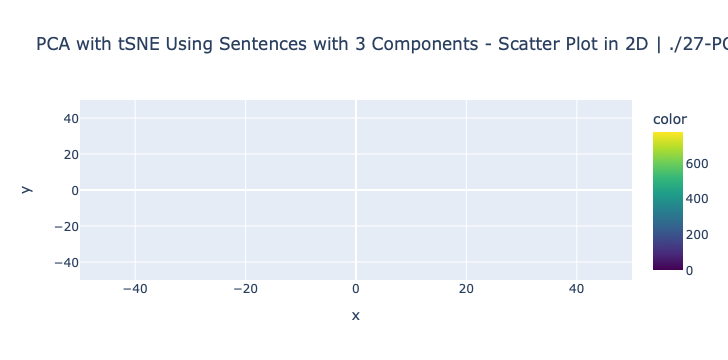

In [34]:
import plotly.express as px

colorscale = px.colors.sequential.Viridis

# Create a scatter 2D plot using Plotly Express
# https://plotly.com/python/figure-labels/
fig_2d = px.scatter(
    sentences_df, 
    x='x', 
    y='y',
    color=clusters,
    color_continuous_scale=colorscale,
    custom_data=['SENTENCE_ID', 'DEVICE_PROBLEM_TEXT'],
    title=f"PCA with tSNE Using Sentences with {tsne_n_components} Components - Scatter Plot in 2D | {working_directory}"
)

# https://stackoverflow.com/questions/59057881/python-plotly-how-to-customize-hover-template-on-with-what-information-to-show
fig_2d.update_traces(
    hovertemplate="<br>".join([
        "x: %{x}",
        "y: %{y}",
        "Color: %{marker.color}",
        "SENTENCE_ID: %{customdata[0]}",
        "TEXT: %{customdata[1]}"
    ])
)

# This limits the axis ranges to remove outliers
fig_2d.update_layout(
    xaxis_range=[-50, 50], 
    yaxis_range=[-50, 50]
)

# write the 2d scatter plot to a file in the working directory
fig_2d.write_html(f"{working_directory}/pca_tsne_2d_plot_with_{tsne_n_components}_components.html")

# Show the plot
fig_2d.show()

In [35]:
import plotly.express as px

fig_3d = px.scatter_3d(
    sentences_df, 
    x='x', 
    y='y',
    z='z',
    color=clusters,
    color_continuous_scale=colorscale,
    custom_data=['SENTENCE_ID', 'DEVICE_PROBLEM_TEXT'],
    title=f"PCA with tSNE Using Sentences with {tsne_n_components} Components - Scatter Plot in 3D | {working_directory}"
)

# https://stackoverflow.com/questions/59057881/python-plotly-how-to-customize-hover-template-on-with-what-information-to-show
fig_3d.update_traces(
    hovertemplate="<br>".join([
        "x: %{x}",
        "y: %{y}",
        "z: %{z}",
        "Color: %{marker.color}",
        "SENTENCE_ID: %{customdata[0]}",
        "TEXT: %{customdata[1]}"
    ])
)

# This limits the axis ranges to remove outliers
fig_3d.update_layout(scene=dict(
    xaxis=dict(range=[-40, 40]),
    yaxis=dict(range=[-50, 50]),
    zaxis=dict(range=[-50, 50])
))

# write the 3d scatter plot to a file in the working directory
fig_3d.write_html(f"{working_directory}/pca_tsne_3d_plot_with_{tsne_n_components}_components.html")

# Show the plot
fig_3d.show()

In [32]:
# Write the sentences dataframe to a CSV file
sentences_df.to_csv(f"{working_directory}/sentences_dataframe.csv", index=False)

## Upload All Output to an S3 Bucket

In [36]:
import os
import fnmatch
import subprocess

bucket = "praxis-2023-html-output"
website = f"http://{bucket}.s3-website-us-west-2.amazonaws.com"

# Use the fnmatch module to find all files in the current directory that end in ".html"
file_list = []
for root, dirnames, filenames in os.walk("."):
    for filename in fnmatch.filter(filenames, '*.html'):
        file_list.append(os.path.join(root, filename))

# Sort the file list alphabetically
file_list.sort()

# Create the HTML file and write the header
with open(os.path.join(".", 'index.html'), 'w') as f:
    f.write('''<html>
        <head>
            <title>Praxis 2023 HTML Output</title>
            <style>
                table {
                    border-collapse: collapse;
                    width: 100%;
                }
                th, td {
                    text-align: left;
                    padding: 8px;
                }
                th {
                    background-color: #007bff;
                    color: #fff;
                    font-weight: bold;
                }
                tr:nth-child(even) {
                    background-color: #f2f2f2;
                }
                tr:hover {
                    background-color: #ddd;
                }
            </style>
        </head>
        <body>
            <table>
                <tr><th>Name</th><th>Size</th></tr>\n
    ''')

    # Loop through each file and add a row to the table
    for file_name in file_list:
        if file_name in ['./index.html']:
            continue
            
        file_size = os.path.getsize(file_name)
        f.write(f'<tr><td><a href="{website}/{file_name}" target="_blank" rel="noopener noreferrer">{file_name}</a></td><td>{int(file_size / 1048576)} MB</td></tr>\n')

    # Write the footer and close the file
    f.write('</table></body></html>')

command = ["aws", "s3", "sync", ".", f"s3://{bucket}", "--exclude", "*", "--include", "*.html", "--no-progress"]

# Run the command and wait for it to complete
output = subprocess.run(command, capture_output=True, text=True)

# Print the output
print(output.stdout)
print('fin')

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
upload: ./index.html to s3://praxis-2023-html-output/index.html
upload: 27-PCA-with-tSNE/pca_tsne_3d_plot_with_3_components.html to s3://praxis-2023-html-output/27-PCA-with-tSNE/pca_tsne_3d_plot_with_3_components.html
upload: 27-PCA-with-tSNE/pca_tsne_2d_plot_with_3_components.html to s3://praxis-2023-html-output/27-PCA-with-tSNE/pca_tsne_2d_plot_with_3_components.html

fin


[Link to images...](http://praxis-2023-html-output.s3-website-us-west-2.amazonaws.com/)